                                                Heat Conduction over 2D domain



$\frac{\partial T}{\partial t} = \alpha \nabla^2 T $

where $T(t,x,y)$ is the temperature distribution  $\alpha$ is the thermal diffusivity, and $\nabla$ is the
Laplacian operator.



X- Domain : [0,1]; $\quad$     Y- DOmain : [0,1];  $\quad$    T- Domain : [0,1]

Initial condition: $\quad$    $T(0,x,y) = -1\degree C$

Boundary conditions: $\quad$  Left BC($T(t,0,y)$) = Right BC($T(t,-1,y)$) = Bottom BC($T(t,x,0)$) = $-1\degree C$ 

Boundary conditions: $\quad$  Top BC($T(t,x,-1)$) = $1\degree C$ 

## Libraries and Dependencies

In [1]:
import sys

import torch
from collections import OrderedDict

from pyDOE import lhs
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
import time

np.random.seed(1234)

Setting device to CUDA

In [2]:
# CUDA support 
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
device

device(type='cuda')

## DNN class

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    def __init__(self, layers):
        super(DNN, self).__init__()
        
        # parameters
        self.depth = len(layers) - 1
        
        # set up activation
        self.activation = torch.nn.Tanh
        
        layer_list = list()
        for i in range(self.depth - 1): 
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            layer_list.append(('activation_%d' % i, self.activation()))
            
        #last layer with linear activation
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        layerDict = OrderedDict(layer_list)
        
        # deploy layers
        self.layers = torch.nn.Sequential(layerDict)
        
    def forward(self, x):
        out = self.layers(x)
        return out

## PINN class

In [5]:
# the physics-informed neural network
class PhysicsInformedNN():
    def __init__(self, X_u, u, X_f, layers, lb, ub, alpha):
        
        # boundary conditions
        # self.lb = torch.tensor(lb).float().to(device)
        # self.ub = torch.tensor(ub).float().to(device)
        
        # extracting BC + IC coordinates
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.y_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 2:3], requires_grad=True).float().to(device)

        # extracting collocation points coordinates
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.y_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 2:3], requires_grad=True).float().to(device)

        # colocation points solutions
        self.u = torch.tensor(u).float().to(device)
        
        self.layers = layers
        self.alpha = alpha
        
        # deep neural networks
        self.dnn = DNN(layers).to(device)
        
        # optimizers: using the same settings
        self.optimizer = torch.optim.LBFGS(
            self.dnn.parameters(), 
            lr=1.0, 
            max_iter=5000, 
            max_eval=5000, 
            history_size=50,
            tolerance_grad=1e-5, 
            tolerance_change=1.0 * np.finfo(float).eps,
            line_search_fn="strong_wolfe"     
        )

        self.iter = 0

    
    # forward pass function to get pred u    
    def net_u(self, x, y, t):  
        u = self.dnn(torch.cat([x, y, t], dim=1))
        return u
    

    def net_f(self, x,y, t):

        # get u from the forward pass
        u = self.net_u(x,y, t)
        
        #compute du/dt using autograd
        u_t = torch.autograd.grad(
            u, t, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        #compute du/dx using autograd
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        #compute d2u/dx2 using autograd
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]

        #compute du/dy using autograd
        u_y = torch.autograd.grad(
            u, y, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        #compute d2u/dy2 using autograd
        u_yy = torch.autograd.grad(
            u_y, y, 
            grad_outputs=torch.ones_like(u_y),
            retain_graph=True,
            create_graph=True
        )[0]
        
        # residual function
        f = u_t - self.alpha * (u_xx + u_yy)

        return f
    
    #Loss function    
    def loss_func(self):
        self.optimizer.zero_grad()        
        
        u_pred = self.net_u(self.x_u,self.y_u, self.t_u)
        f_pred = self.net_f(self.x_f,self.y_f, self.t_f)

        # MSE loss at BC+IC
        loss_u = torch.mean((self.u - u_pred) ** 2)
        # PDE loss at collocation points + BC + IC
        loss_f = torch.mean(f_pred ** 2)
        
        # Total loss
        loss = loss_u + loss_f
        
        loss.backward()
        self.iter += 1
        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.item(), loss_u.item(), loss_f.item())
            )
        return loss
    
    # training function    
    def train(self):
        self.dnn.train()
                
        # Backward and optimize
        self.optimizer.step(self.loss_func)

    # Inference function    
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        y = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)
        t = torch.tensor(X[:, 2:3], requires_grad=True).float().to(device)

        self.dnn.eval()
        u = self.net_u(x,y, t)
        f = self.net_f(x, y, t)
        u = u.detach().cpu().numpy()
        f = f.detach().cpu().numpy()
        return u, f

## Data generation and preprocessing

In [6]:
t = np.linspace(0,1,100)  #N_t = 100
# plt.plot(t)

In [7]:
x = np.linspace(0,1,50) #N_x = 100
# plt.plot(x)

In [8]:
y = np.linspace(0,1,50) #N_y = 100
# plt.plot(y)

In [9]:
# create a meshgrid with 3 coordinates
X, Y, T = np.meshgrid(x,y,t,indexing='ij')

print("Shape of grid", X.shape)

Shape of grid (50, 50, 100)


In [10]:
X.flatten()[:,None].shape

(250000, 1)

In [11]:
X_star = np.hstack((X.flatten()[:,None], Y.flatten()[:,None],  T.flatten()[:,None]))  
X_star.shape

(250000, 3)

## Initial and Boundary conditions

In [12]:
# IC coordinates
ic_x = np.dstack((X[:,:,0:1],Y[:,:,0:1], T[:,:,0:1]))
ic_x = ic_x.reshape((ic_x.shape[0]*ic_x.shape[1],3))
ic_x.shape

(2500, 3)

In [13]:
# IC Temp
ic_u = -1 * np.ones((ic_x.shape[0],1))
print(ic_u.shape)


(2500, 1)


In [14]:
# left BC coordinates
left_bc = np.vstack((X[0:1,:,:],Y[0:1,:,:], T[0:1,:,:]))
left_bc = left_bc.reshape((3,X.shape[1]*X.shape[2])).T
left_bc.shape

(5000, 3)

In [15]:
# left BC Temp
left_bc_u = -1 * np.ones((left_bc.shape[0],1))
print(left_bc_u.shape)

(5000, 1)


In [16]:
# right BC coordinates
right_bc = np.vstack((X[-1,:,:],Y[-1,:,:], T[-1,:,:]))
right_bc = right_bc.reshape((3,X.shape[1]*X.shape[2])).T
right_bc.shape

(5000, 3)

In [17]:
# right BC Temp
right_bc_u = -1 * np.ones((right_bc.shape[0],1))
print(right_bc_u.shape)

(5000, 1)


In [18]:
# Top BC coordinates
top_bc = np.vstack((X[:,-1,:],Y[:,-1,:], T[:,-1,:]))
top_bc = top_bc.reshape((3,Y.shape[0]*Y.shape[2])).T
top_bc.shape

(5000, 3)

In [19]:
# Top BC Temp
top_bc_u = 1 * np.ones((top_bc.shape[0],1))
print(top_bc_u.shape)

(5000, 1)


In [20]:
# Bottom BC coordinates
bottom_bc = np.vstack((X[:,0,:],Y[:,0,:], T[:,0,:]))
bottom_bc = bottom_bc.reshape((3,Y.shape[0]*Y.shape[2])).T
bottom_bc.shape

(5000, 3)

In [21]:
bottom_bc_u = -1 * np.ones((bottom_bc.shape[0],1))
print(bottom_bc_u.shape)

(5000, 1)


Stacking all BC + IC

In [22]:
X_u_train = np.vstack([ic_x, left_bc, right_bc, top_bc,bottom_bc])
X_u_train.shape

(22500, 3)

In [23]:
# X_u_train[1:1000,:]

In [24]:
u_train = np.vstack([ic_u, left_bc_u,right_bc_u, top_bc_u, bottom_bc_u])
u_train.shape

(22500, 1)

Collocation points

In [25]:
N_u = 1000 # Random BC+IC points
N_f = 10000 # collocation points


# Domain bounds
lb = X_star.min(0)
ub = X_star.max(0)  
print(lb)
print(ub)

[0. 0. 0.]
[1. 1. 1.]


In [26]:
# generate random collocation points
X_f_train = lb + (ub-lb)*lhs(3, N_f)
X_f_train.shape

(10000, 3)

In [27]:
# stack BC+IC + collocation points to satisfy PDE loss
X_f_train = np.vstack((X_f_train, X_u_train))
X_f_train.shape

(32500, 3)

choose random points to minimize MSE on BC+IC

In [28]:
idx = np.random.choice(X_u_train.shape[0], N_u, replace=False)
# idx

In [29]:
# get random BC+IC points and temp on them to find MSE
X_u_train = X_u_train[idx, :]
u_train = u_train[idx,:]

print("X_u_train", X_u_train.shape)
print("u_train", u_train.shape)

X_u_train (1000, 3)
u_train (1000, 1)


## Training

In [30]:
alpha = 0.1  # diffusivity
layers = [3, 40, 40, 40, 20, 1] # DNN layers

In [31]:
model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub, alpha)

In [32]:
%%time
               
model.train()

Iter 100, Loss: 1.18629e-01, Loss_u: 1.12962e-01, Loss_f: 5.66633e-03
Iter 200, Loss: 7.89830e-02, Loss_u: 7.55821e-02, Loss_f: 3.40087e-03
Iter 300, Loss: 6.88396e-02, Loss_u: 6.47469e-02, Loss_f: 4.09276e-03
Iter 400, Loss: 6.10074e-02, Loss_u: 5.51877e-02, Loss_f: 5.81972e-03
Iter 500, Loss: 5.73309e-02, Loss_u: 5.02819e-02, Loss_f: 7.04898e-03
Iter 600, Loss: 5.28843e-02, Loss_u: 4.55146e-02, Loss_f: 7.36973e-03
Iter 700, Loss: 4.69097e-02, Loss_u: 4.05991e-02, Loss_f: 6.31054e-03
Iter 800, Loss: 4.33548e-02, Loss_u: 3.79046e-02, Loss_f: 5.45024e-03
Iter 900, Loss: 4.09255e-02, Loss_u: 3.62663e-02, Loss_f: 4.65917e-03
Iter 1000, Loss: 3.85697e-02, Loss_u: 3.44597e-02, Loss_f: 4.11000e-03
Iter 1100, Loss: 3.63777e-02, Loss_u: 3.23577e-02, Loss_f: 4.02002e-03
Iter 1200, Loss: 3.49737e-02, Loss_u: 3.08906e-02, Loss_f: 4.08312e-03
Iter 1300, Loss: 3.39251e-02, Loss_u: 3.02566e-02, Loss_f: 3.66852e-03
Iter 1400, Loss: 3.29910e-02, Loss_u: 2.92534e-02, Loss_f: 3.73763e-03
Iter 1500, Loss

In [30]:
import os
# Get the current working directory
current_dir = os.getcwd()

# Specify the file name
file_name = 'model.pth'

# Combine the current directory and file name to create the full path
path = os.path.join(current_dir, file_name)

# Save the entire model (including architecture and parameters)
# torch.save(model, path)


In [31]:
model = torch.load(path)

In [32]:
u_pred, f_pred = model.predict(X_star)

u_pred.shape

(250000, 1)

In [33]:
X_star.shape

(250000, 3)

## Visualizations

In [35]:
U_pred = u_pred.reshape((X.shape[0],X.shape[1],X.shape[2]))
U_pred.shape

(50, 50, 100)

In [36]:
X_u_train.shape

(1000, 3)

In [37]:
X_u_train[:,0:2]

array([[0.59183673, 0.        ],
       [0.20408163, 0.        ],
       [0.59183673, 0.89795918],
       ...,
       [1.        , 0.73469388],
       [1.        , 0.69387755],
       [0.20408163, 0.44897959]])

In [38]:
X_u_train

array([[0.59183673, 0.        , 0.58585859],
       [0.20408163, 0.        , 0.28282828],
       [0.59183673, 0.89795918, 0.        ],
       ...,
       [1.        , 0.73469388, 0.44444444],
       [1.        , 0.69387755, 0.27272727],
       [0.20408163, 0.44897959, 0.        ]])

In [39]:
U_pred[0,0,0]

-1.0125294

In [40]:
# U_pred[:,0,0]

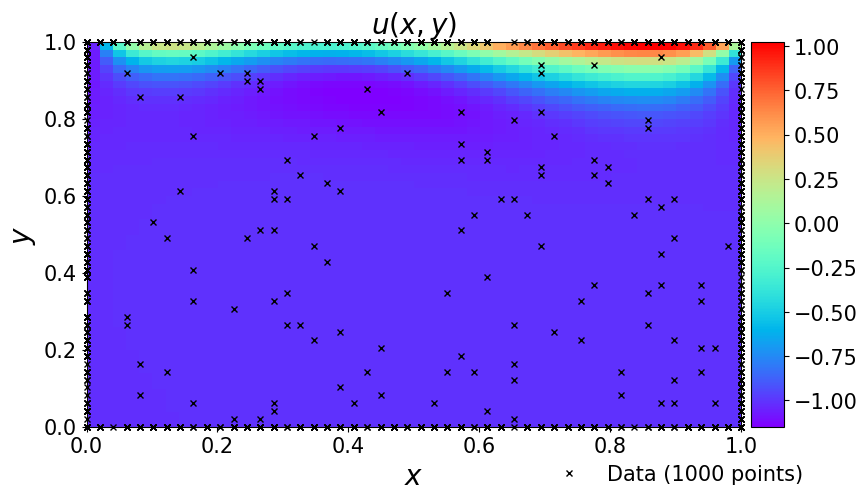

In [41]:

""" The aesthetic setting has changed. """

####### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5))
ax = fig.add_subplot(111)

h = ax.imshow(U_pred[:,:,0].T, interpolation='nearest', cmap='rainbow', 
              extent=[x.min(), x.max(), y.min(), y.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15) 

ax.plot(
    X_u_train[:,1], 
    X_u_train[:,0], 
    'kx', label = 'Data (%d points)' % (u_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
)



ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
ax.set_title('$u(x,y)$', fontsize = 20) # font size doubled
ax.tick_params(labelsize=15)

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


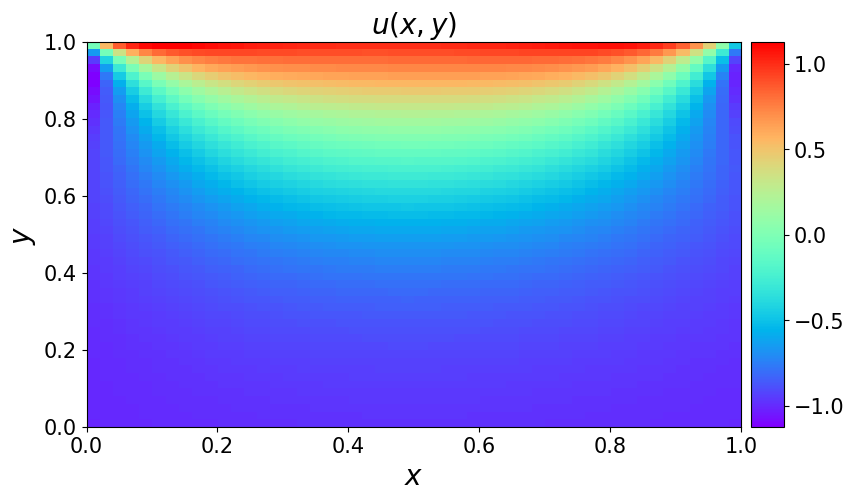

In [42]:

""" The aesthetic setting has changed. """

####### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5))
ax = fig.add_subplot(111)

h = ax.imshow(U_pred[:,:,-1].T, interpolation='nearest', cmap='rainbow', 
              extent=[x.min(), x.max(), y.min(), y.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15) 

# ax.plot(
#     X_u_train[:,1], 
#     X_u_train[:,0], 
#     'kx', label = 'Data (%d points)' % (u_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# )



ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
ax.set_title('$u(x,y)$', fontsize = 20) # font size doubled
ax.tick_params(labelsize=15)

plt.show()

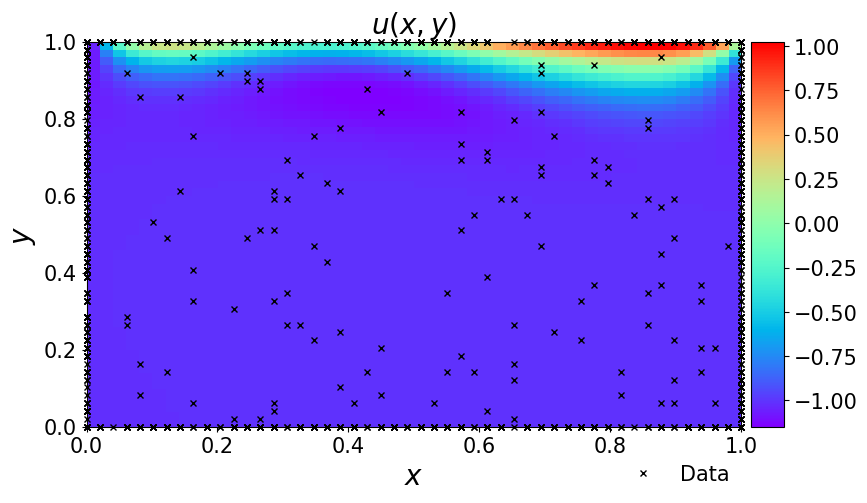

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming U_pred, x, y, t are defined
# U_pred should be a 3D array with shape (len(x), len(y), len(t))
# x, y, t should be 1D arrays

fig, ax = plt.subplots(figsize=(9, 5))

# Initial plot
h = ax.imshow(U_pred[:,:,0].T, interpolation='nearest', cmap='rainbow',
              extent=[min(x), max(x), min(y), max(y)],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)

scatter = ax.plot([], [], 'kx', label='Data', markersize=4, clip_on=False, alpha=1.0)[0]

ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.legend(loc='upper center', bbox_to_anchor=(0.9, -0.05), ncol=5, frameon=False, prop={'size': 15})
ax.set_title('$u(x,y)$', fontsize=20)
ax.tick_params(labelsize=15)

def update(frame):
    h.set_array(U_pred[:, :, frame].T)
    scatter.set_data(X_u_train[:, 1], X_u_train[:, 0])
    return h, scatter

# print()

animation = FuncAnimation(fig, update, frames=len(t), interval=100, blit=True)

plt.show()

from IPython.display import HTML
HTML(animation.to_jshtml())


In [44]:
np.save('U_pred.npy', U_pred)

# Comparing PINNs with FDM

In [90]:
U_pred_loaded = np.load('U_pred.npy')
U_FDM_loaded = np.load('u_final.npy')

In [91]:
U_pred_loaded.shape

(50, 50, 100)

In [92]:
U_FDM_loaded.shape

(50, 50, 10000)

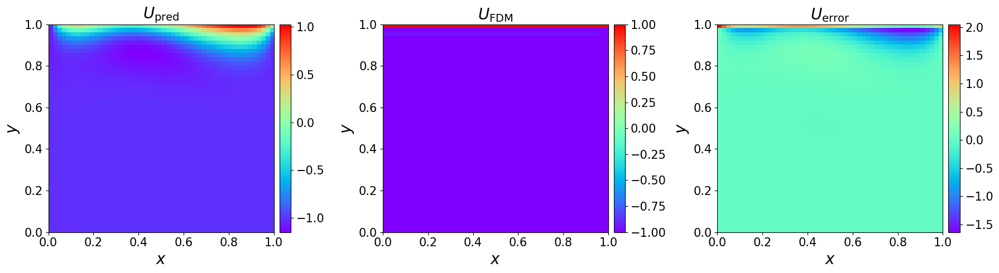

In [93]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming U_FDM_loaded and U_error are also available in your code

# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Subplot 1: U_pred_loaded
ax = axs[0]
h = ax.imshow(U_pred_loaded[:, :, 0].T, interpolation='nearest', cmap='rainbow',
              extent=[x.min(), x.max(), y.min(), y.max()],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{pred}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Subplot 2: U_FDM_loaded
ax = axs[1]
# Assuming U_FDM_loaded is a 2D array similar to U_pred_loaded
h = ax.imshow(U_FDM_loaded[:, :,0].T, interpolation='nearest', cmap='rainbow',
              extent=[x.min(), x.max(), y.min(), y.max()],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{FDM}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Subplot 3: U_error
ax = axs[2]
# Assuming U_error is a 2D array similar to U_pred_loaded and U_FDM_loaded
h = ax.imshow((U_FDM_loaded[:, :,0].T - U_pred_loaded[:, :, 0].T), interpolation='nearest', cmap='rainbow',
              extent=[x.min(), x.max(), y.min(), y.max()],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{error}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


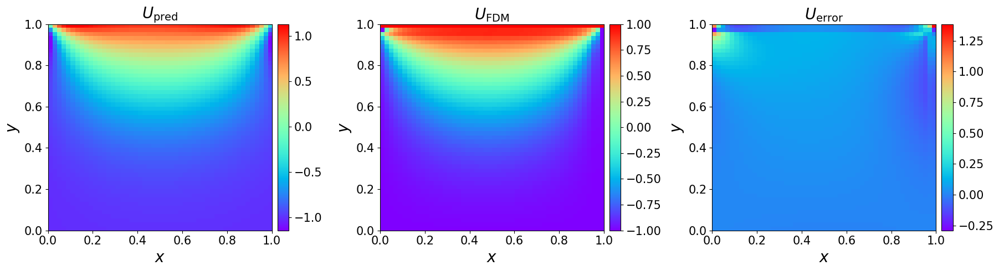

In [100]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming U_FDM_loaded and U_error are also available in your code

# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Subplot 1: U_pred_loaded
ax = axs[0]
h = ax.imshow(U_pred_loaded[:, :, 80].T, interpolation='nearest', cmap='rainbow',
              extent=[x.min(), x.max(), y.min(), y.max()],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{pred}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Subplot 2: U_FDM_loaded
ax = axs[1]
# Assuming U_FDM_loaded is a 2D array similar to U_pred_loaded
h = ax.imshow(U_FDM_loaded[:, :,8000].T, interpolation='nearest', cmap='rainbow',
              extent=[x.min(), x.max(), y.min(), y.max()],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{FDM}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Subplot 3: U_error
ax = axs[2]
# Assuming U_error is a 2D array similar to U_pred_loaded and U_FDM_loaded
h = ax.imshow((U_FDM_loaded[:, :,8000].T - U_pred_loaded[:, :, 80].T), interpolation='nearest', cmap='rainbow',
              extent=[x.min(), x.max(), y.min(), y.max()],
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{error}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


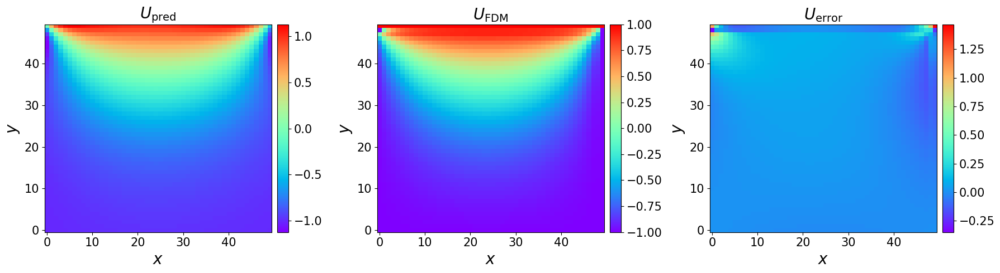

In [101]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming U_FDM_loaded and U_error are also available in your code

# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Subplot 1: U_pred_loaded
ax = axs[0]
h = ax.imshow(U_pred_loaded[:, :,-1].T, interpolation='nearest', cmap='rainbow',
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{pred}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Subplot 2: U_FDM_loaded
ax = axs[1]
# Assuming U_FDM_loaded is a 2D array similar to U_pred_loaded
h = ax.imshow(U_FDM_loaded[:, :,-1].T, interpolation='nearest', cmap='rainbow',
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{FDM}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Subplot 3: U_error
ax = axs[2]
# Assuming U_error is a 2D array similar to U_pred_loaded and U_FDM_loaded
h = ax.imshow((U_FDM_loaded[:, :,-1].T - U_pred_loaded[:, :, -1].T), interpolation='nearest', cmap='rainbow',
              
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.10)
cbar = fig.colorbar(h, cax=cax)
cbar.ax.tick_params(labelsize=15)
ax.set_xlabel('$x$', size=20)
ax.set_ylabel('$y$', size=20)
ax.set_title('$U_{\mathrm{error}}$', fontsize=20)
ax.tick_params(labelsize=15)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()
